In [2]:
# Import modules
import flowsom as fs
import pytometry as pm
import scanpy as sc
import csv
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import fcsparser
import FlowCal
import anndata as ad
import pooch


# set default plotting parameters
plt.rcParams["figure.figsize"] = (6.5, 4.8)
plt.rcParams["figure.dpi"] = 300
plt.rcParams["font.size"] = 10

In [3]:
barcodes = pd.read_csv("/Volumes/USB DISK/Others/Radiohead/Teiko/data/Users/shane/Documents/GitHub/PICI002/fcs/v01/PICI002_v01_concatenated_fcs/barcodes.csv")

biorepository_2025_merged = pd.read_csv("/Users/cponti/Desktop/BioRepository/biorepository 2025/biorepo_2025_df_clean_REDCap_records_merged.csv")

df_clean = pd.read_csv("/Users/cponti/Desktop/BioRepository/REDCap/df_clean_ready_for_web_app.csv")

In [4]:
# Survides and not survided
survivors_ids = pd.unique(df_clean[df_clean['subject_dead'] == 0]['subject_id'])
non_survivors_ids = pd.unique(df_clean[df_clean['subject_dead'] == 1]['subject_id'])

samples_survivors = biorepository_2025_merged[biorepository_2025_merged['Participant ID'].isin(survivors_ids)]
samples_non_survivors = biorepository_2025_merged[biorepository_2025_merged['Participant ID'].isin(non_survivors_ids)]

In [5]:
fcs_barcodes = pd.unique(barcodes['Client Sample ID'])

In [6]:
file_path = "/Volumes/USB DISK/Others/Radiohead/Teiko/data/Users/shane/Documents/GitHub/PICI002/fcs/v01/PICI002_v01_concatenated_fcs/fcs_files/cytonorm-Teiko035-006_blend_PIC002_P01_Pop04.fcs"
meta, data = fcsparser.parse(file_path)
print("Number of cells (rows):", data.shape[0])

Number of cells (rows): 279810


In [7]:
import os
fcs_folder = "/Volumes/USB DISK/Others/Radiohead/Teiko/data/Users/shane/Documents/GitHub/PICI002/fcs/v01/PICI002_v01_concatenated_fcs/fcs_files/"
filenames = os.listdir(fcs_folder)

filename_dict = {}

for filename in filenames:
    parts = filename.split('_')

    if filename.startswith('.'):
        file_path = "/Volumes/USB DISK/Others/Radiohead/Teiko/data/Users/shane/Documents/GitHub/PICI002/fcs/v01/PICI002_v01_concatenated_fcs/fcs_files/" + filename[2:]
    else:
        file_path = "/Volumes/USB DISK/Others/Radiohead/Teiko/data/Users/shane/Documents/GitHub/PICI002/fcs/v01/PICI002_v01_concatenated_fcs/fcs_files/" + filename

    meta, data = fcsparser.parse(file_path)
    num_cells = data.shape[0]

    if len(parts) >= 5:
        # Extract population and PID based on known positions
        for part in parts:
            if len(part) == 3:
                pid = part
            if part.startswith('Pop'):
                pop = part.split('.')[0].lower()

            
        if pid and pop:
            filename_dict[file_path] = [pid, pop, num_cells]
        else:
            print(f"Missing PID or pop in filename: {filename}")
    else:
        print(f"Filename format unexpected: {filename}")
            



In [9]:
def collect_filename_metadata(
    merged_df, barcodes_df, fcs_barcodes, filename_dict, fcs_folder):
    # List of relevant timepoints
    timepoints = [
        'Pre-Treatment', 'On Treatment', 'Follow Up', 'Follow-Up1', 'Follow-Up2',
        'Irae', 'Irae 4 Week Follow-Up', 'Irae 6 Month Follow-Up', 'Irae 12 Month Follow-Up',
        'Eosi', 'End Of Study'
    ]

    # Output: one row per matched file
    metadata_rows = []

    for tp in timepoints:
        # Subset merged_df by timepoint
        tp_df = merged_df[merged_df['Barcode Timepoint'] == tp]
        tp_barcodes = pd.unique(tp_df['Barcode'])

        # Intersect with FCS barcodes
        tp_fcs = set(fcs_barcodes) & set(tp_barcodes)

        # Build barcode -> (PID, Barcode #) lookup
        tp_dict = {}
        for barcode in tp_fcs:
            row = barcodes_df[barcodes_df['Client Sample ID'] == barcode]
            if not row.empty:
                pid = row['PID'].values[0]
                pop = row['Barcode #'].values[0]
                tp_dict[barcode] = (pid, pop)

        # Match filenames
        for filepath, (pid, pop, num_cells) in filename_dict.items():
            for barcode, (b_pid, b_pop) in tp_dict.items():
                if (pid, pop) == (b_pid, b_pop):
                    # Lookup Participant ID in merged_df
                    match = merged_df[merged_df['Barcode'] == barcode]
                    if not match.empty:
                        participant_id = match['Participant ID'].values[0]
                        cancer_type = match['Cancer Type'].values[0] if 'Cancer Type' in match.columns else None

                    else:
                        participant_id = None
                        cancer_type = None

                    metadata_rows.append({
                                'Filename': filepath,
                                'Timepoint': tp,
                                'Patient ID': participant_id,
                                'Barcode': barcode,
                                'Barcode #': b_pop,
                                'PID': b_pid,
                                'Cancer Type': cancer_type
                            })
                    break  # No need to keep scanning this filename

    # Convert to DataFrame
    return pd.DataFrame(metadata_rows)


In [10]:
metadata_rows = collect_filename_metadata( merged_df=biorepository_2025_merged, barcodes_df=barcodes,
    fcs_barcodes=fcs_barcodes, filename_dict=filename_dict, fcs_folder=fcs_folder
)

metadata_rows

,Filename,Timepoint,Patient ID,Barcode,Barcode #,PID,Cancer Type
0,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Pre-Treatment,3-1858,BK15064,pop18,P03,Melanoma
1,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Pre-Treatment,Mar-16,BK15086,pop18,P17,Melanoma
2,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Pre-Treatment,3-1557,BK13252,pop17,P06,Melanoma
3,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Pre-Treatment,3-1115,BK10465,pop10,P14,Melanoma
4,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Pre-Treatment,4-1015,BK12426,pop13,P14,Melanoma
...,...,...,...,...,...,...,...
237,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Irae 12 Month Follow-Up,3-1649,10964281,pop10,P16,NaN
238,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,End Of Study,5-1129,11008911,pop12,P12,Melanoma
239,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,End Of Study,4-1002,10838501,pop04,P15,Melanoma
240,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,End Of Study,5-1132,11008913,pop11,P25,Melanoma


In [11]:
metadata_rows.to_csv('metadata_rows.csv')

In [12]:
filtered_metadata = pd.DataFrame()
used_filepaths = set()

timepoints = [
        'Pre-Treatment', 'On Treatment', 'Follow Up', 'Follow-Up1', 'Follow-Up2',
        'Irae', 'Irae 4 Week Follow-Up', 'Irae 6 Month Follow-Up', 'Irae 12 Month Follow-Up',
        'Eosi', 'End Of Study'
    ]

for timepoint in timepoints:
    subset = metadata_rows[metadata_rows['Timepoint'] == timepoint].copy()

    subset = subset[~subset['Filename'].isin(used_filepaths)]
  
    if subset.shape[0] > 25:
        subset = subset.sample(n=25, random_state=42)  
    
    used_filepaths.update(subset['Filename'])

    filtered_metadata = pd.concat([filtered_metadata, subset], ignore_index=True)


# Optional: check for any duplicates in the final result
if filtered_metadata['Filename'].duplicated().any():
    print("⚠️ Warning: Duplicated file paths found in the filtered_metadata.")
else:
    print("No duplicated file paths in filtered_metadata.")

No duplicated file paths in filtered_metadata.


In [13]:
filtered_metadata['Cancer Type'].value_counts()

Cancer Type
Melanoma    77
Name: count, dtype: int64

In [14]:
filtered_metadata['Timepoint'].value_counts()

Timepoint
Pre-Treatment              25
On Treatment               25
Irae                       25
Irae 4 Week Follow-Up      19
Follow-Up1                 15
Irae 6 Month Follow-Up      9
Irae 12 Month Follow-Up     1
Name: count, dtype: int64

In [15]:
# downsample function 
def downsample(file_path, timepoint, patient_id, barcode, pop, pid, max_cells=1000):
    import fcsparser
    import anndata as ad
    import pandas as pd

    # load fcs file 
    meta, data = fcsparser.parse(file_path)
    
    # downsample if needed
    if len(data) > max_cells:
        data = data.sample(n=max_cells, random_state=23)
    
    # create AnnData object
    adata = ad.AnnData(data)
    adata.obs['Filename'] = file_path
    adata.obs['Timepoint'] = timepoint
    adata.obs['Patient ID'] = patient_id
    adata.obs['Barcode'] = barcode
    adata.obs['Barcode #'] = pop
    adata.obs['PID'] = pid

    return adata


adata_list = []

for _, row in filtered_metadata.iterrows():
    cancer = row['Cancer Type'] # strip removes extra spaces

    if cancer == 'Melanoma':
        file_path = row['Filename']
        timepoint = row['Timepoint']
        patient_id = row['Patient ID']
        barcode = row['Barcode']
        pop = row['Barcode #']
        pid = row['PID']

        try:
            adata = downsample(file_path, timepoint, patient_id, barcode, pop, pid)
            adata.obs['sample_id'] = file_path  
            adata_list.append(adata)
        except Exception as e:
            print(f"Error processing {file_path}: {e}")

merged_adata = ad.concat(adata_list, join="outer", axis=0, label="sample_id", keys=[a.obs['sample_id'][0] for a in adata_list])


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Library/Frameworks/Python.f

In [16]:
merged_adata.write('downsample_mealanoma.h5ad', compression="gzip")

In [17]:
merged_adata.shape

(77000, 74)

In [ ]:
import scanpy as sc

# Dimensionality reduction
sc.tl.pca(merged_adata, svd_solver='arpack')

sc.pp.neighbors(merged_adata, n_neighbors=10, n_pcs=40)
sc.tl.leiden(merged_adata, resolution=0.5)  # Try 0.3, 0.2, or 0.1
markers_to_exclude = ['Residual', 'Time', 'beadDist', '131Xe_Environ', 'Center', 'Width', 'Event_length', 'Offset',  '138Ba_Environ', '120Sn_Environ', '133Cs_Environ', 'Event_length' ]
# Create a boolean mask for genes to keep
markers_to_keep = ~merged_adata.var_names.isin(markers_to_exclude)
# Filter the AnnData object
merged_adata = merged_adata[:, markers_to_keep].copy()
# Normalize and log-transform the data
sc.pp.normalize_total(merged_adata, target_sum=1e4)
sc.pp.log1p(merged_adata)
sc.pp.highly_variable_genes(merged_adata, n_top_genes=1000)
merged_adata = merged_adata[:, merged_adata.var.highly_variable]
sc.pp.scale(merged_adata)


#sc.pp.neighbors(merged_adata, n_neighbors=50, n_pcs=40)
sc.tl.umap(merged_adata)

# Plot
sc.pl.umap(merged_adata, color=["PID"])  # Replace with your metadata key



/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/var/folders/d9/gs24bvf10dq_lnn5k5nqrblm0000gp/T/ipykernel_1434/3444244158.py:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(merged_adata, resolution=0.5)  # Try 0.3, 0.2, or 0.1
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-

KeyboardInterrupt: 

In [201]:
# take only pre_treatment samples
merged_adata_pre = merged_adata[merged_adata.obs['Timepoint'] == 'Pre-Treatment'].copy()
merged_adata_pre.shape

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


(25000, 74)

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/preprocessing/_scale.py:309: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


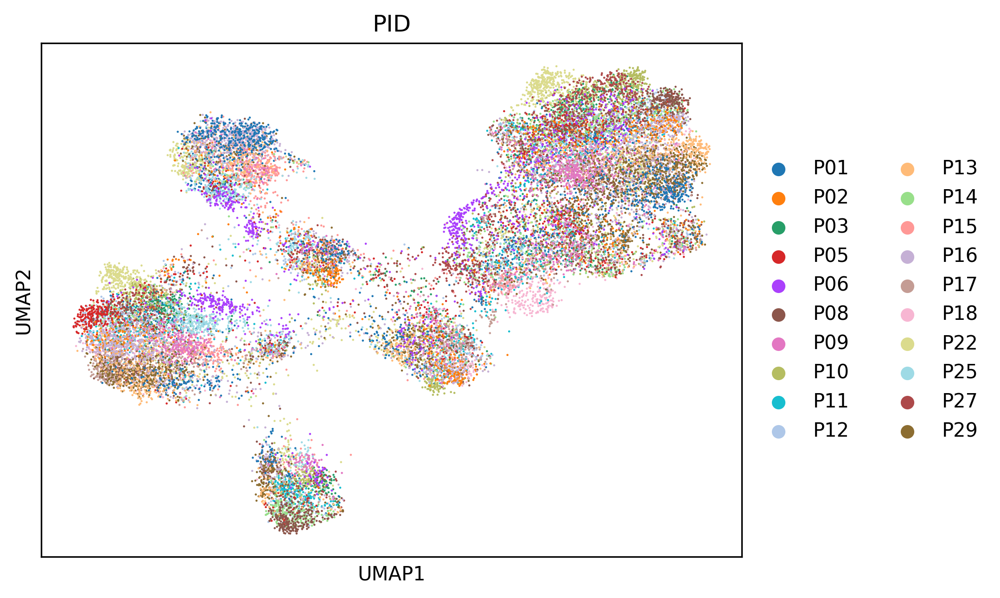

In [202]:
import scanpy as sc

sc.tl.leiden(merged_adata_pre, resolution=0.5)  # Try 0.3, 0.2, or 0.1
markers_to_exclude = ['Residual', 'Time', 'beadDist', '131Xe_Environ', 'Center', 'Width', 'Event_length', 'Offset',  '138Ba_Environ', '120Sn_Environ', '133Cs_Environ', 'Event_length' ]
# Create a boolean mask for genes to keep
markers_to_keep = ~merged_adata_pre.var_names.isin(markers_to_exclude)
# Filter the AnnData object
merged_adata_pre = merged_adata_pre[:, markers_to_keep].copy()
# Normalize and log-transform the data
sc.pp.normalize_total(merged_adata_pre, target_sum=1e4)
sc.pp.log1p(merged_adata_pre)
sc.pp.highly_variable_genes(merged_adata_pre, n_top_genes=1000)
merged_adata_pre = merged_adata_pre[:, merged_adata_pre.var.highly_variable]
sc.pp.scale(merged_adata_pre)


# Dimensionality reduction
sc.tl.pca(merged_adata_pre,  n_comps=50, svd_solver='arpack')
sc.pp.neighbors(merged_adata_pre, n_neighbors=50, n_pcs=30)
sc.tl.umap(merged_adata_pre)

# Plot
sc.pl.umap(merged_adata_pre, color=["PID"])  # Replace with your metadata key



In [180]:
merged_adata_on = merged_adata[merged_adata.obs['Timepoint'] == 'On Treatment'].copy()
merged_adata_on.shape

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


(25000, 74)

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/preprocessing/_scale.py:309: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


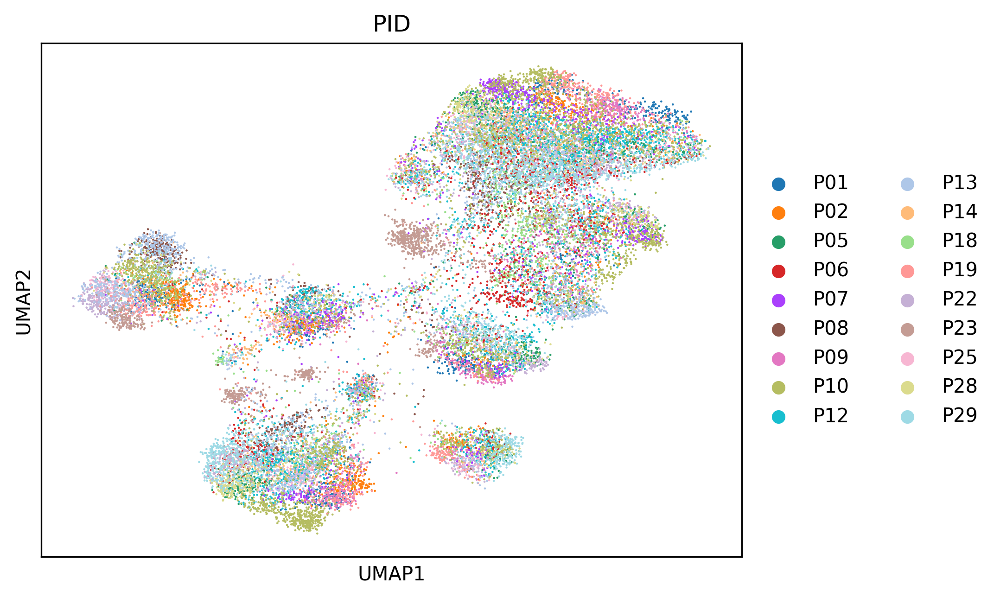

In [181]:
import scanpy as sc

sc.tl.leiden(merged_adata_on, resolution=0.5)  # Try 0.3, 0.2, or 0.1
markers_to_exclude = ['Residual', 'Time', 'beadDist', '131Xe_Environ', 'Center', 'Width', 'Event_length', 'Offset',  '138Ba_Environ', '120Sn_Environ', '133Cs_Environ', 'Event_length' ]
# Create a boolean mask for genes to keep
markers_to_keep = ~merged_adata_on.var_names.isin(markers_to_exclude)
# Filter the AnnData object
merged_adata_on = merged_adata_on[:, markers_to_keep].copy()
# Normalize and log-transform the data
sc.pp.normalize_total(merged_adata_on, target_sum=1e4)
sc.pp.log1p(merged_adata_on)
sc.pp.highly_variable_genes(merged_adata_on, n_top_genes=100)
merged_adata_on = merged_adata_on[:, merged_adata_on.var.highly_variable]
sc.pp.scale(merged_adata_on)


# Dimensionality reduction
sc.tl.pca(merged_adata_on, svd_solver='arpack')
sc.pp.neighbors(merged_adata_on, n_neighbors=50, n_pcs=40)
sc.tl.umap(merged_adata_on)

# Plot
sc.pl.umap(merged_adata_on, color=["PID"])  # Replace with your metadata key



In [186]:
merged_adata_followup1 = merged_adata[merged_adata.obs['Timepoint'] == 'Follow-Up1'].copy()
merged_adata_followup1.shape

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


(15000, 74)

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/preprocessing/_scale.py:309: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


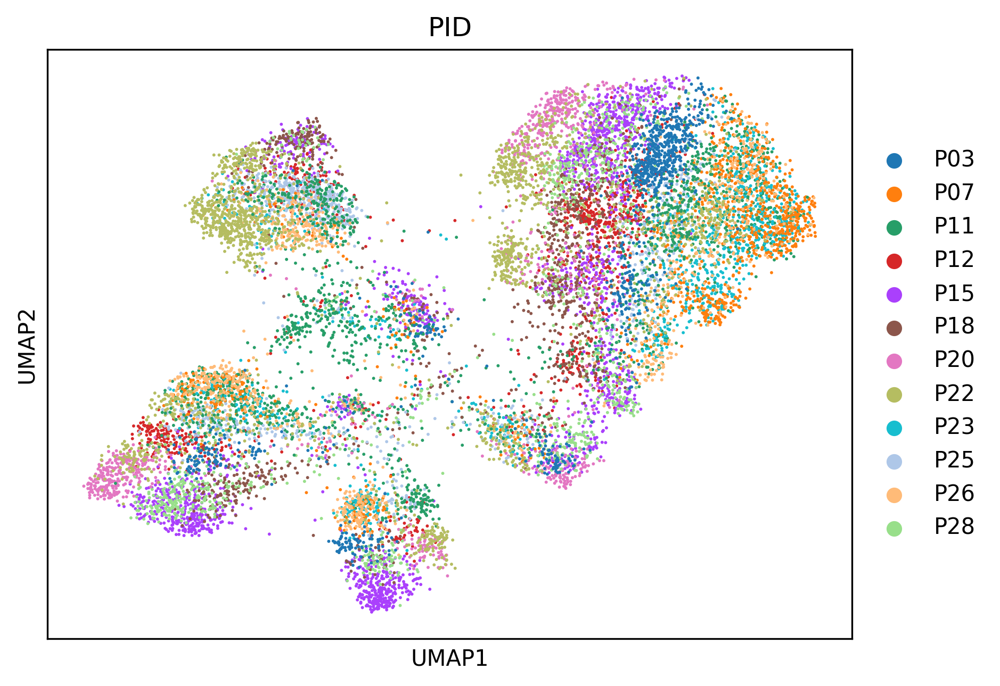

In [187]:
import scanpy as sc

sc.tl.leiden(merged_adata_followup1, resolution=0.5)  # Try 0.3, 0.2, or 0.1
markers_to_exclude = ['Residual', 'Time', 'beadDist', '131Xe_Environ', 'Center', 'Width', 'Event_length', 'Offset',  '138Ba_Environ', '120Sn_Environ', '133Cs_Environ', 'Event_length' ]
# Create a boolean mask for genes to keep
markers_to_keep = ~merged_adata_followup1.var_names.isin(markers_to_exclude)
# Filter the AnnData object
merged_adata_followup1 = merged_adata_followup1[:, markers_to_keep].copy()
# Normalize and log-transform the data
sc.pp.normalize_total(merged_adata_followup1, target_sum=1e4)
sc.pp.log1p(merged_adata_followup1)
sc.pp.highly_variable_genes(merged_adata_followup1, n_top_genes=1000)
merged_adata_followup1 = merged_adata_followup1[:, merged_adata_followup1.var.highly_variable]
sc.pp.scale(merged_adata_followup1)


# Dimensionality reduction
sc.tl.pca(merged_adata_followup1, svd_solver='arpack')
sc.pp.neighbors(merged_adata_followup1, n_neighbors=50, n_pcs=40)
sc.tl.umap(merged_adata_followup1)

# Plot
sc.pl.umap(merged_adata_followup1, color=["PID"])  # Replace with your metadata key



In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# extract pca coordinates
X_pca = merged_adata_pre.obsm['X_pca'] 

# kmeans with k=5
kmeans = KMeans(n_clusters=5, random_state=0).fit(X_pca) 
merged_adata_pre.obs['kmeans5'] = kmeans.labels_.astype(str)

# kmeans with k=10
kmeans = KMeans(n_clusters=10, random_state=0).fit(X_pca) 
merged_adata_pre.obs['kmeans10'] = kmeans.labels_.astype(str)

# kmeans with k=15
kmeans = KMeans(n_clusters=15, random_state=0).fit(X_pca) 
merged_adata_pre.obs['kmeans15'] = kmeans.labels_.astype(str)

sc.pl.umap(merged_adata_pre, color=['kmeans5', 'kmeans10', 'kmeans15'])

In [16]:
print(merged_adata.shape)

(77000, 74)


In [108]:
merged_adata.X

array([[3.38103175e+06, 2.30000000e+01, 1.09724098e+02, ...,
        9.44990005e+01, 1.26249001e+02, 1.03136284e+02],
       [1.71363612e+06, 4.40000000e+01, 8.79033432e+01, ...,
        1.36188995e+02, 1.73843002e+02, 6.36281090e+01],
       [4.52824950e+06, 4.80000000e+01, 1.55333603e+02, ...,
        1.05458000e+02, 1.80106003e+02, 8.36765289e+01],
       ...,
       [1.55321488e+06, 2.30000000e+01, 1.52258011e+02, ...,
        9.62030029e+01, 1.48947998e+02, 8.15354004e+01],
       [1.91027219e+05, 3.10000000e+01, 3.63579803e+02, ...,
        8.16230011e+01, 1.07857002e+02, 9.60620346e+01],
       [7.83132650e+06, 3.30000000e+01, 4.53907471e+02, ...,
        1.06928001e+02, 1.61085999e+02, 7.65958099e+01]], dtype=float32)

In [17]:
import scipy.sparse
print(scipy.sparse.issparse(merged_adata.X))


False


In [18]:
sc.pp.pca(merged_adata, n_comps=20)
sc.pp.neighbors(merged_adata, n_neighbors=15, n_pcs=20)  

In [21]:
live_mask = merged_adata[:, "195Pt_Live_Dead"].X.flatten() < 1.0
merged_adata_alive = merged_adata[live_mask].copy()

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


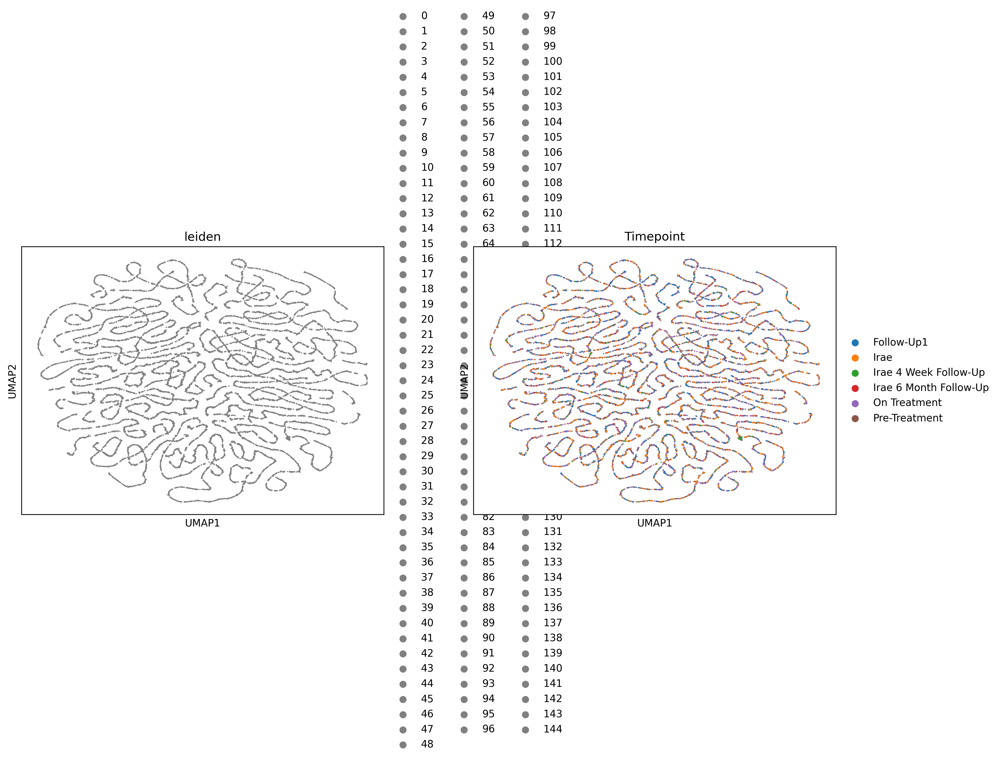

In [22]:
import scanpy as sc

sc.pp.neighbors(merged_adata_alive, n_pcs=30)
sc.tl.umap(merged_adata_alive)
sc.tl.leiden(merged_adata_alive, resolution=1.0)

sc.pl.umap(merged_adata_alive, color=["leiden", "Timepoint"])


In [25]:
sc.pp.pca(merged_adata, n_comps=20)
sc.pp.neighbors(merged_adata, n_neighbors=15, n_pcs=20)  




In [ ]:
sc.tl.leiden(merged_adata_alive, resolution=0.1)  # Try 0.3, 0.2, or 0.1


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:480: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:479: RuntimeWarning: invalid value encountered in divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:480: Run

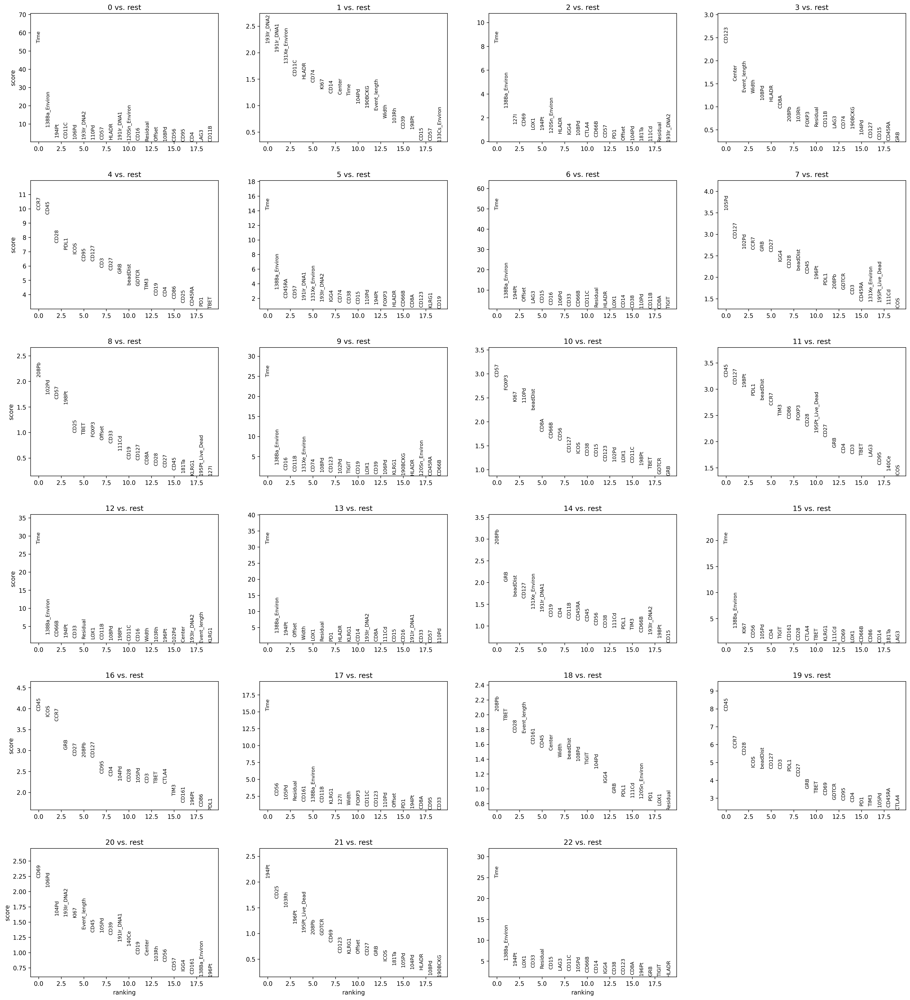

In [91]:
# Identify Cluster-Specific Markers
sc.tl.rank_genes_groups(merged_adata_alive, groupby="leiden", method="wilcoxon")
sc.pl.rank_genes_groups(merged_adata_alive, n_genes=20, sharey=False)

In [92]:
merged_adata.var

""
Time
Event_length
CD45
102Pd
103Rh
...
Center
Offset
Width
Residual


In [93]:
markers_to_exclude = ['Residual', 'Time', 'beadDist', '131Xe_Environ', 'Center', 'Width', 'Event_length', 'Offset',  '138Ba_Environ', '120Sn_Environ', '133Cs_Environ', 'Event_length' ]

In [94]:
# Create a boolean mask for genes to keep
markers_to_keep = ~merged_adata_alive.var_names.isin(markers_to_exclude)

    # Filter the AnnData object
adata_filtered = merged_adata_alive[:, markers_to_keep].copy()

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [95]:
sc.pp.pca(merged_adata, n_comps=50)
sc.pp.neighbors(merged_adata, n_neighbors=15, n_pcs=30)  

sc.tl.leiden(merged_adata_alive, resolution=0.01)  # Try 0.3, 0.2, or 0.1



/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:480: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:479: RuntimeWarning: invalid value encountered in divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:480: Run

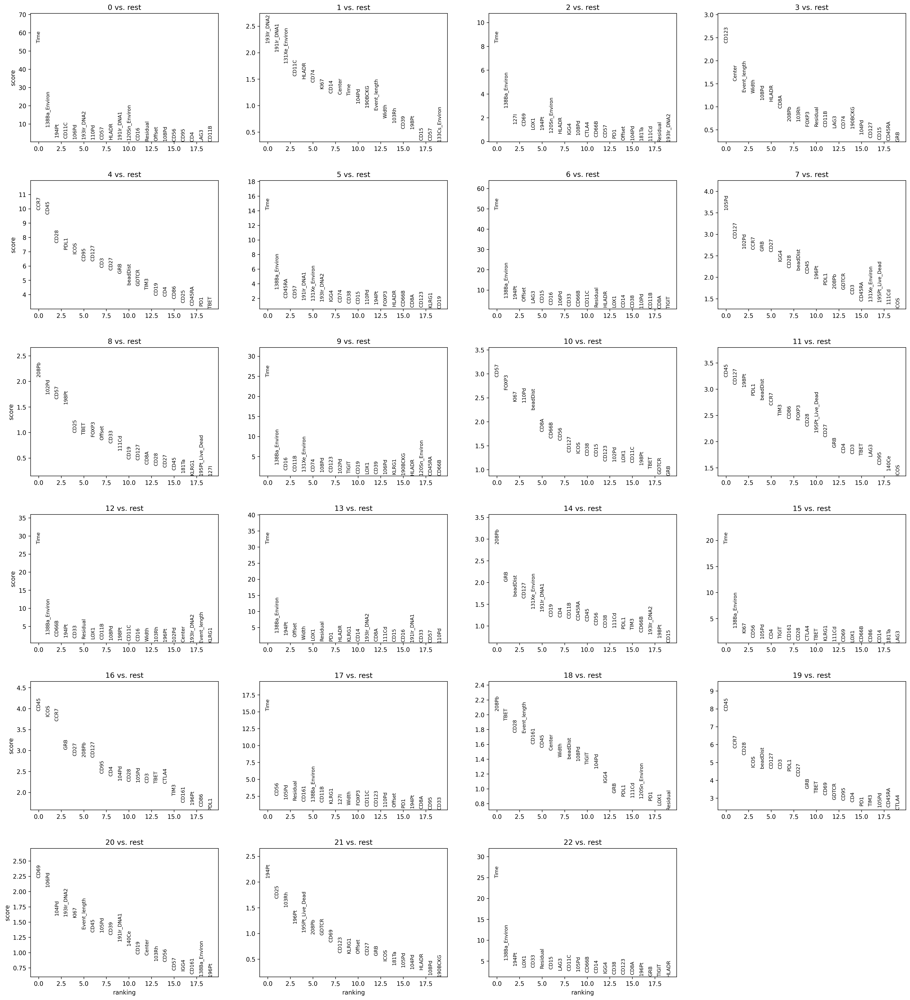

In [78]:
# Identify Cluster-Specific Markers
sc.tl.rank_genes_groups(merged_adata_alive, groupby="leiden", method="wilcoxon")
sc.pl.rank_genes_groups(merged_adata_alive, n_genes=20, sharey=False)

In [97]:
print('X_umap' in merged_adata_alive.obsm)

True


In [98]:
merged_adata_alive

AnnData object with n_obs × n_vars = 17497 × 74
    obs: 'Filename', 'Timepoint', 'Patient ID', 'Barcode', 'Barcode #', 'PID', 'sample_id', 'leiden'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Timepoint_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [99]:
print(merged_adata_alive.obs['leiden'].dtype)




category


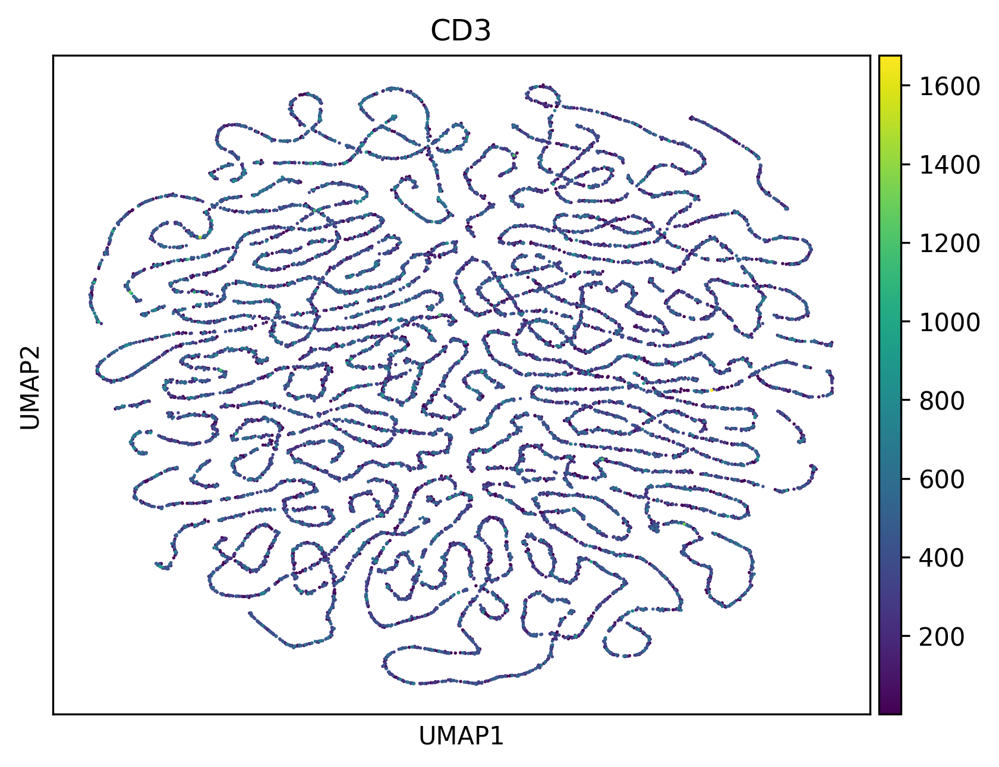

In [100]:
sc.pl.umap(merged_adata_alive, color='CD3') 


In [83]:
print(merged_adata_alive.obs['leiden'].isna().sum())  # Should be 0
print(merged_adata_alive.obs['leiden'].unique())      # Should show distinct cluster labels


0
['1', '17', '14', '18', '10', ..., '20', '12', '0', '6', '22']
Length: 23
Categories (23, object): ['0', '1', '2', '3', ..., '19', '20', '21', '22']


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scanpy/plotting/_utils.py:481: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


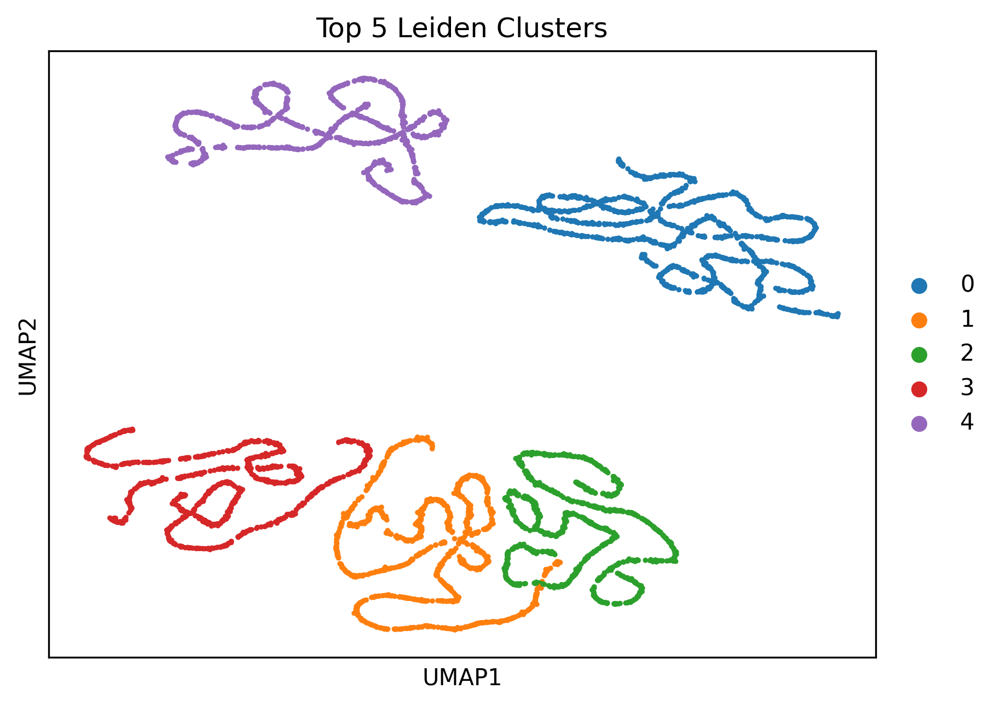

In [84]:

# Get top 5 clusters by number of cells
top_clusters = (
    merged_adata_alive.obs['leiden'].value_counts().nlargest(5).index.tolist()
)

# Subset to only cells in those clusters
subset = merged_adata_alive[merged_adata_alive.obs['leiden'].isin(top_clusters)]

# Plot subset
sc.pl.umap(subset, color='leiden', legend_loc='right margin', title='Top 5 Leiden Clusters')


In [85]:
merged_adata.obs

,Filename,Timepoint,Patient ID,Barcode,Barcode #,PID,sample_id
196178,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Pre-Treatment,3-1038,BK10449,pop02,P22,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...
120068,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Pre-Treatment,3-1038,BK10449,pop02,P22,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...
208385,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Pre-Treatment,3-1038,BK10449,pop02,P22,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...
185066,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Pre-Treatment,3-1038,BK10449,pop02,P22,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...
192016,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Pre-Treatment,3-1038,BK10449,pop02,P22,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...
...,...,...,...,...,...,...,...
182429,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Irae 6 Month Follow-Up,3-1148,BK13064,pop18,P05,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...
275687,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Irae 6 Month Follow-Up,3-1148,BK13064,pop18,P05,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...
33802,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Irae 6 Month Follow-Up,3-1148,BK13064,pop18,P05,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...
336124,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...,Irae 6 Month Follow-Up,3-1148,BK13064,pop18,P05,/Volumes/USB DISK/Others/Radiohead/Teiko/data/...


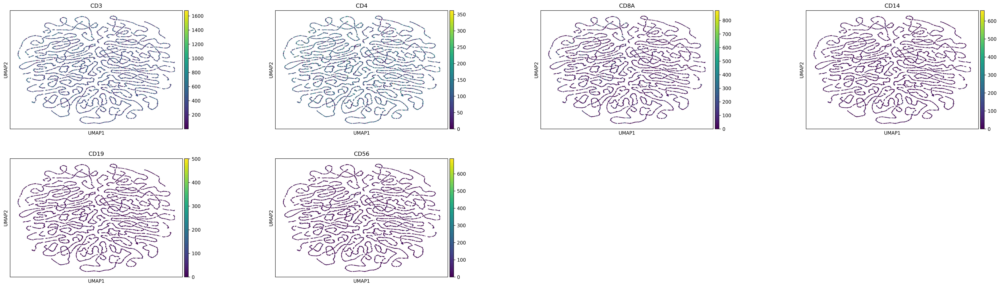

In [86]:
sc.pl.umap(merged_adata_alive, color=['CD3', 'CD4', 'CD8A', 'CD14', 'CD19', 'CD56'], wspace=0.4)
